Technological Institute of the Philippines | Quezon City - Computer Engineering
--- | ---
Course Code: | CPE 313
Code Title: | Advanced Machine Learning and Deep Learning
2nd Semester | AY 2024-2025
<hr> | <hr>
<u>**ACTIVITY NO. 6** | **Face Detection using OpenCV**
**Name** | Apuyan, Viktor Angelo
**Section** | CPE32S3
**Date Performed**: | February 20, 2025
**Date Submitted**: | February 21, 2025
**Instructor**: | Engr. Roman M. Richard

<hr>

## 1. Objectives

This activity aims to allow students to perform face detection on still images and videos using Haar cascades.

## 2. Intended Learning Outcomes (ILOs)
After this activity, the students should be able to:
* Utilize OpenCV to detect faces in still images and videos.
* Demonstrate the use of Haar-like features for detection of other human features.

## 3. Procedures and Outputs

Contrary to initial assumptions, conducting face detection on a static image and a video stream shares a remarkable similarity. Essentially, the latter is merely a sequential rendition of the former: when detecting faces in videos, it essentially involves applying face detection to every individual frame obtained from the camera feed. Of course, video face detection introduces additional elements like tracking, which aren't relevant to static images. Nevertheless, it's valuable to recognize that the fundamental principles behind both processes remain consistent.

### Performing face detection on still image

The first and most basic way to perform face detection is to load an image and detect faces in it. To make the result visually meaningful, we will draw rectangles around faces on the original image.

**Before implementing the code below**, check the contents of the `cv2.CascadeClassifier()` function. Provide an explanation of the function, its parameters before running the code below.

In [7]:
# Make sure that for this activity, you have downloaded the
# file indicated below from the resource linked in the instructional materials
# in the module.

import cv2
from google.colab.patches import cv2_imshow

picPath = '/content/breaking_bad.jpg'
haarPath = '/content/haarcascade_frontalface_default.xml'

def faceDetect(picPath):
  face_cascade = cv2.CascadeClassifier(haarPath)

  img = cv2.imread(picPath)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  faces = face_cascade.detectMultiScale(gray, 1.3, 5)

  for (x, y, w, h) in faces:
    img = cv2.rectangle(img, (x, y), (x+w, y+h), (0,0,255), 5)

  cv2_imshow(img)

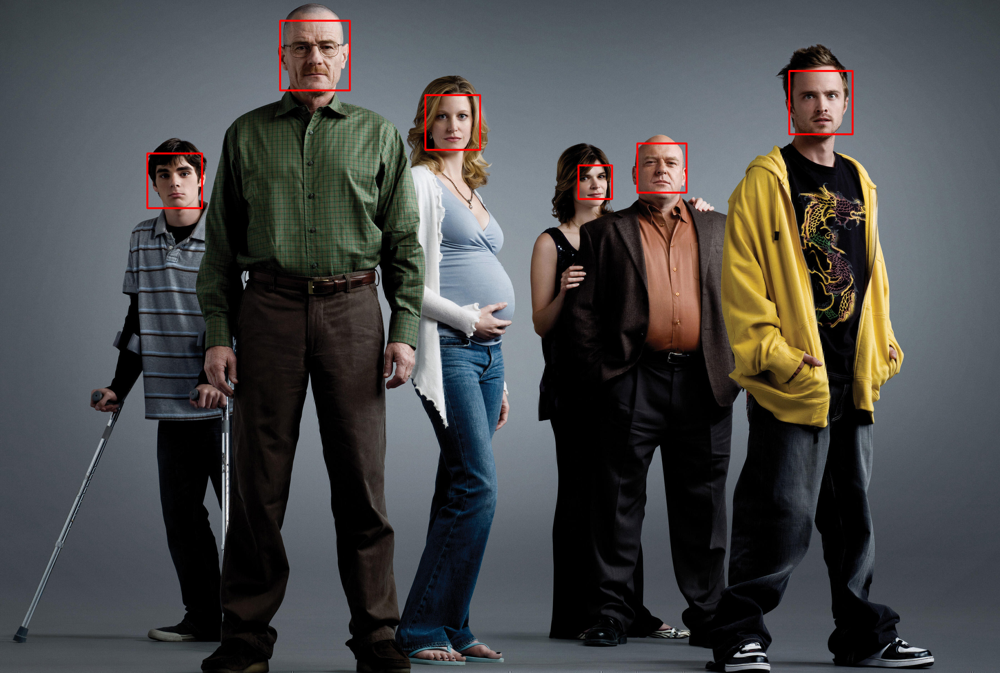

In [8]:
faceDetect(picPath)

**Analysis**:
- Based on your earlier analysis, where do you think the face detection works in the line of code above?
  - Face detection occurs in the line using the detectMultiScale method, where the classifier scans the grayscale image or frame to locate faces and returns coordinates for the detected regions.
- Provide an analysis of the parameters of the `detectMultiScale` method.
  - The scaleFactor parameter controls how much the image size is reduced at each scale, thereby assisting the detector to locate faces of varying sizes, typically in the range of 1.1-1.4. The minNeighbors parameter defines how many neighboring rectangles must be present in order for detection to stand. This parameter should thereby be higher in order to make detection stricter. The minSize parameter determines the minimum size of the object to be detected and will thus filter out smaller, irrelevant regions. These parameters will balance the accuracy of the detection with its performance.
- Change the color of the border of the detected faces to red.
  - To change the border to red, change the line of code from img = cv2.rectangle(img, (x, y), (x+w, y+h), (255,0,0), 2) and change the pixel values to (0,0,255) which makes the border appear red.
- Are you able to make the borders thicker? Demonstrate.
  - Yes, the border thickness can be increased by adjusting the last parameter in cv2.rectangle, e.g., setting it to 5 will make the border thicker.

### Performing face detection on video

**Step 1**: Create a file called face_detection.py and include the following codes.

In [ ]:
import cv2

**Step 2:** After this, we declare a method, `detect()`, which will perform face detection.

In [ ]:
def detect():
  face_cascade = cv2.CascadeClassifier('/content/haarcascade_frontalface_default.xml')
  eye_cascade = cv2.CascadeClassifier('/content/haarcascade_eye.xml')
  camera = cv2.VideoCapture(0)

**Step 3:** The first thing we need to do inside the detect() method is to load the Haar cascade files so that OpenCV can operate face detection. As we copied
the cascade files in the local `cascades/` folder, we can use a relative path. Then, we open a VideoCapture object (the camera feed). The VideoCapture  constructor takes a parameter, which indicates the camera to be used; zero indicates the first camera available.

In [ ]:
  while (True):
    ret, frame = camera.read()
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

**Step 4:** Next up, we capture a frame. The read() method returns two values: a Boolean indicating the success of the frame read operation, and the frame
itself. We capture the frame, and then we convert it to grayscale. This is a necessary operation, because face detection in OpenCV happens in the grayscale color space:

In [ ]:
faces = face_cascade.detectMultiScale(gray, 1.3, 5)

**Step 5:** Much like the single still image example, we call detectMultiScale on the grayscale version of the frame.

In [ ]:
  for (x,y,w,h) in faces:
    img = cv2.rectangle(frame,(x,y),(x+w,y+h),(255,0,0),2)
    roi_gray = gray[y:y+h, x:x+w]
    eyes = eye_cascade.detectMultiScale(roi_gray, 1.03,
    5, 0, (40,40))

**Step 6:** Here we have a further step compared to the still image example: we create a region of interest corresponding to the face rectangle, and within this rectangle, we operate "eye detection". This makes sense as you wouldn't want to go looking for eyes outside a face (well, for human beings at least!).

In [ ]:
  for (ex,ey,ew,eh) in eyes:
    cv2.rectangle(img,(ex,ey),(ex+ew,ey+eh),
    (0,255,0),2)

**Step 7:** Again, we loop through the resulting eye tuples and draw green rectangles around them.

In [ ]:

    cv2.imshow("camera", frame)
    if cv2.waitKey(1000 / 12) & 0xff == ord("q"):
      break

  camera.release()
  cv2.destroyAllWindows()

if __name__ == "__main__":
detect()

**Provide the following**:
- Screenshot of the output for the working code once you've put it all together.
- Summary of the steps you've performed along with observations.

In [ ]:
import cv2

def detect():
    face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
    if face_cascade.empty():
        print("Error: Could not load face cascade.")
        return

    eye_cascade = cv2.CascadeClassifier('haarcascade_eye.xml')
    if eye_cascade.empty():
        print("Warning: Could not load eye cascade. Eye detection will be skipped.")

    camera = cv2.VideoCapture(0)

    if not camera.isOpened():
        print("Error: Could not open camera.")
        return

    while True:
        ret, frame = camera.read()
        if not ret:
            print("Error: Could not read frame.")
            break

        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, 1.3, 5)

        for (x, y, w, h) in faces:
            cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 2)
            roi_gray = gray[y:y+h, x:x+w]
            eyes = eye_cascade.detectMultiScale(roi_gray, 1.03, 5, 0, (40, 40))
            for (ex, ey, ew, eh) in eyes:
                cv2.rectangle(frame, (ex + x, ey + y), (ex + ew + x, ey + eh + y), (0, 255, 0), 2)

        cv2.imshow('camera', frame)

        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    camera.release()
    cv2.destroyAllWindows()

if __name__ == "__main__":
    detect()

Screenshot of output

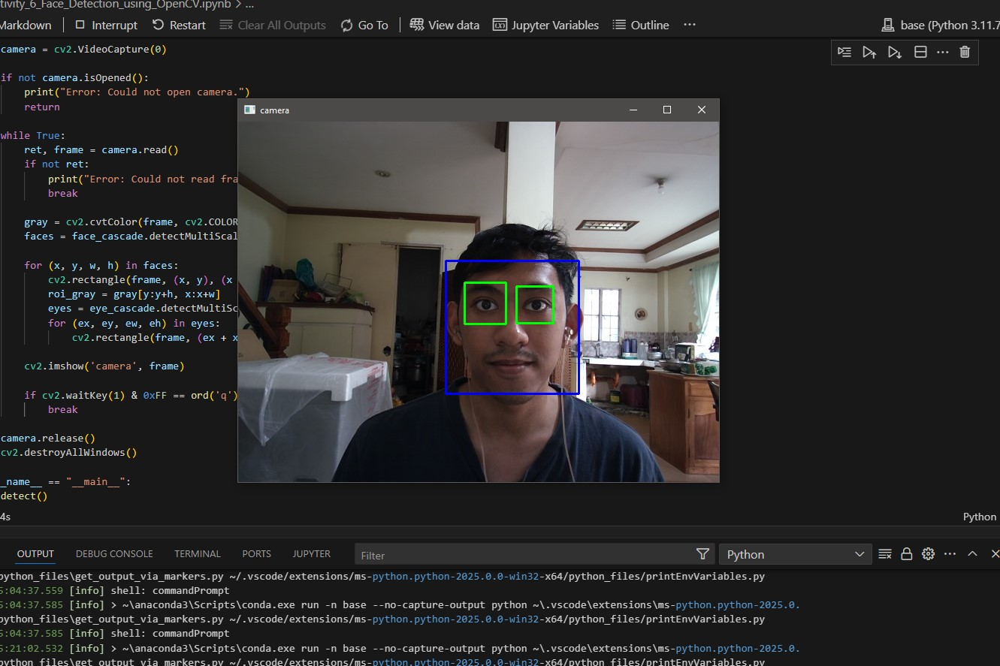

Summary of steps

This OpenCV face detection software begins with the import of the cv2 library and loading of Haar Cascade classifiers for both face and eye detection. I included checks for loading errors, dealing with the inability to open the face cascade and issuing a warning that the eye cascade couldn't be opened, allowing the program to go on without eye detection. The webcam was initiated by calling cv2.VideoCapture(0), checking its capability for use and acting if an error was prompted on opening the camera. The frames were read in a loop, changing them to grayscale in order to make the processing faster, and detectMultiScale was used to indicate faces and eyes. Moreover, with the depended rectangle drawn in blue on detected faces and in green on eyes. I faced problems with lagging video feed as cv2.waitKey(0) was making it halt frame updates, and I overcame this by changing this key function to cv2.waitKey(1) for the video to play smoothly. Furthermore, I also put in place a clean exit, allowing the user to exit by pressing 'q' for the program.

## 4. Supplementary Activity

In your Cameo project, include real-time face detection using Haar cascade. Show screenshots of the working demonstration for this supplementary activity.

Additionally, implement similar steps to detect a smile using Haar cascades.

In [ ]:
import cv2

# Load the cascades
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
smile_cascade = cv2.CascadeClassifier('haarcascade_smile.xml') # Make sure you have this file
eye_cascade = cv2.CascadeClassifier('haarcascade_eye.xml')

# Initialize the camera
camera = cv2.VideoCapture(0)

if not camera.isOpened():
    print("Error: Could not open camera.")
    exit()

while True:
    ret, frame = camera.read()
    if not ret:
        print("Error: Could not read frame.")
        break

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    for (x, y, w, h) in faces:
        cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 2)

        # Detect smiles within the face region
        roi_gray = gray[y:y + h, x:x + w]
        smiles = smile_cascade.detectMultiScale(roi_gray, scaleFactor=2.7, minNeighbors=22, minSize=(25, 25))
        eyes = eye_cascade.detectMultiScale(roi_gray, 1.03, 5, 0, (40, 40))
        for (ex, ey, ew, eh) in eyes:
            cv2.rectangle(frame, (ex + x, ey + y), (ex + ew + x, ey + eh + y), (0, 0, 255), 2)
        for (sx, sy, sw, sh) in smiles:
            cv2.rectangle(frame, (x + sx, y + sy), (x + sx + sw, y + sy + sh), (0, 255, 0), 2)

    cv2.imshow('Real-time Face and Smile Detection', frame)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

camera.release()
cv2.destroyAllWindows()


Screenshot of working output

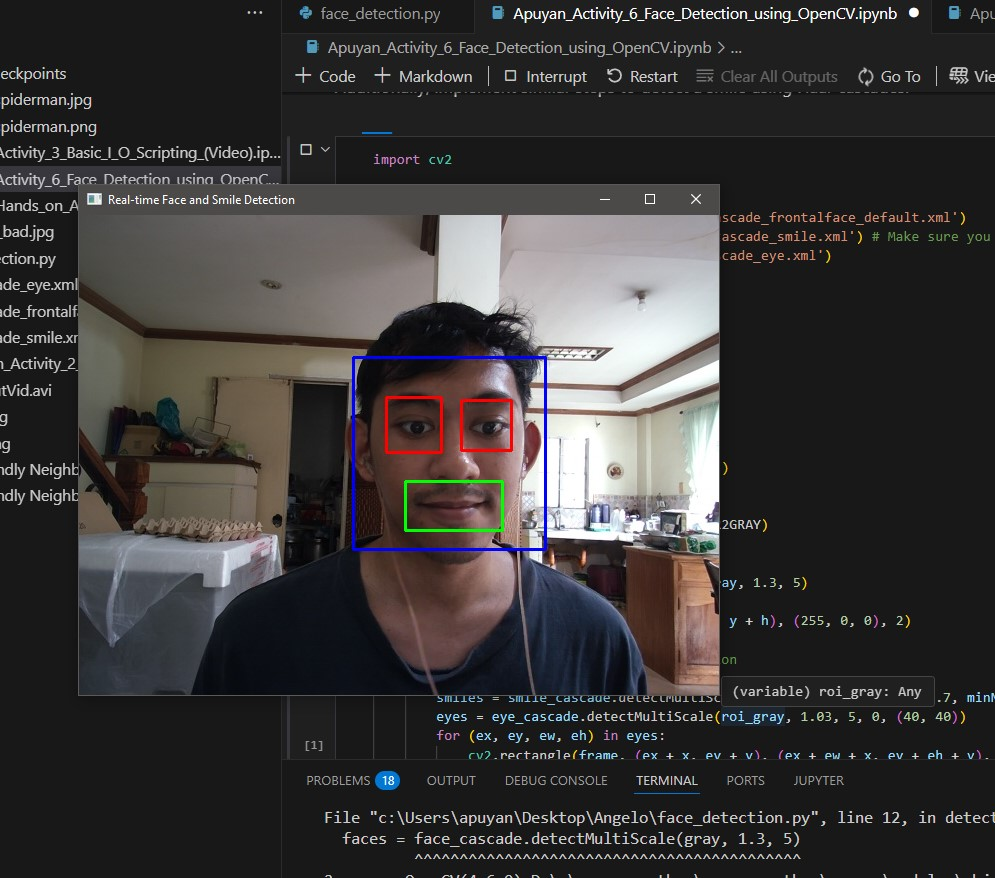

## 5. Summary, Conclusions and Lessons Learned

In this activity, most of the time when we are doing face detection we used the Haar Cascade classifier. I learned that it is a machine learning-based approach for object detection and it is used to perform face detection on still images and videos. Haar Cascades employ analytic or feature-based methods which they use a training dataset consisting of positive and negative images to teach the classifier on how to identify various objects or faces through simple rectangular patterns.

The procedure of still image involved loading the image and converting it to grayscale, since Haar Cascades work more efficiently with single-channel images. The haarcascade_frontalface_default.xml classifier was employed to find faces, which were then highlighted with rectangles. Finally, this result was depicted using OpenCV's imshow function. In video face detection, a webcam was used to detect faces and eyes in real-time. This webcam live feed was translated into gray scale, and both haarcascade frontal face and haarcascade eye classifiers were applied to the frames. Rectangles were drawn around detected faces and the eyes were highlighted within those patches. The stream continued until the user pressed 'q', at which point the camera was released and all windows closed.

Hence, it can be concluded that the activity illustrated how OpenCVs Haar Cascade classifier might be exercised to facilitate face detection on still images and live video. The implementation of pre-trained Haar Cascades allowed the system to effectively detect and showcase faces, thus demonstrating the robustness and simplicity of this classical computer-vision technique. The activity provided hands-on experience in the implementation of object detection with an emphasis on image preprocessing, such as using grayscale conversion, and real-time video processing. Overall, the activity highlighted how machine learning-based approaches, such as Haar Cascades, can be used for practical face and feature detection, creating the foundation for further computer vision applications.

<hr/>

***Proprietary Clause***

*Property of the Technological Institute of the Philippines (T.I.P.). No part of the materials made and uploaded in this learning management system by T.I.P. may be copied, photographed, printed, reproduced, shared, transmitted, translated, or reduced to any electronic medium or machine-readable form, in whole or in part, without the prior consent of T.I.P.*